# Label Error Detection Benchmark New Method Sandbox

### This notebook contains a sandbox enviornment to test new label quality scores scoring methods against 'self_confidence' for label error detection using pred probs from multiple models (cross-validated and not) and multiple datasets. If you have a new scoring function in mind, implement it in [SANDBOX] section and compare it's results against self_confidence.

### Datasets tested on:
- cifar10
- cifar10-worst
- cifar10-aggregate
- food-101n
- roman-numeral

### Models tested on:
- Swin Transformer
- Twin Transformers
- Resnet18
- Resnet50
- Efficient Net

# [Notebook Settup]
(Imports, data loading, function defining)
## Imports

In [258]:
%load_ext autoreload
%autoreload 2

import cleanlab
from cleanlab.rank import get_label_quality_scores, get_label_quality_ensemble_scores
from cleanlab.internal.label_quality_utils import get_normalized_entropy
from cleanlab.filter import find_label_issues
import sys
import numpy as np
import pandas as pd
from pathlib import Path
from sklearn.metrics import roc_auc_score, f1_score, precision_score, recall_score, precision_recall_curve, accuracy_score, log_loss, auc
from matplotlib import pyplot as plt
import copy

sys.path.insert(0, "../")
from eval_metrics import lift_at_k
from active_learning_scores import least_confidence
from experimental_scores import probability_mass_above_given_label_score

# experimental version of label quality ensemble scores with additional weighting schemes
from label_quality_ensemble_scores_experimental import get_label_quality_ensemble_scores_experimental

pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.max_colwidth', None)

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


### Models

## Load files from experiments
**Note:** Models are trained using xval models trained with 5-fold cross validation and their predicted probabilities are referenced as "xval" or "held-out" pred_probs. Predicted probabilities gained from single-pass training are referenced as "" or "in-sample" pred_probs.

In [159]:
# TODO Add food-verified-train import

In [160]:
# !wget -nc 'https://cleanlab-public.s3.amazonaws.com/LabelErrorDetectionBenchmarks/cifar-10n-agg/results/cifar-10n-aggregate.zip'
# !wget -nc 'https://cleanlab-public.s3.amazonaws.com/LabelErrorDetectionBenchmarks/cifar-10n-agg/xval-results/cifar-10n-aggregate-xval.zip'

# !wget -nc 'https://cleanlab-public.s3.amazonaws.com/LabelErrorDetectionBenchmarks/cifar-10n-worst/results/cifar-10n-worst.zip'
# !wget -nc 'https://cleanlab-public.s3.amazonaws.com/LabelErrorDetectionBenchmarks/cifar-10n-worst/xval-results/cifar-10n-worst-xval.zip'

# !wget -nc 'https://cleanlab-public.s3.amazonaws.com/LabelErrorDetectionBenchmarks/cifar-10s/results/cifar-10s.zip'
# !wget -nc 'https://cleanlab-public.s3.amazonaws.com/LabelErrorDetectionBenchmarks/cifar-10s/xval-results/cifar-10s-xval.zip'

# !wget -nc 'https://cleanlab-public.s3.amazonaws.com/LabelErrorDetectionBenchmarks/roman-numeral/results/roman-numeral.zip'
# !wget -nc 'https://cleanlab-public.s3.amazonaws.com/LabelErrorDetectionBenchmarks/roman-numeral/xval-results/roman-numeral-xval.zip'

# !wget -nc 'https://cleanlab-public.s3.amazonaws.com/LabelErrorDetectionBenchmarks/food-101n/results/food-101n.zip'
# !wget -nc 'https://cleanlab-public.s3.amazonaws.com/LabelErrorDetectionBenchmarks/food-101n/xval-results/food-101n-xval.zip'

# !wget -nc 'https://cleanlab-public.s3.amazonaws.com/LabelErrorDetectionBenchmarks/food-101n/data/verified_train.tsv'

In [161]:
# !unzip -d cifar-10n-aggregate cifar-10n-aggregate.zip
# !unzip -d cifar-10n-aggregate-xval cifar-10n-aggregate-xval.zip
# !unzip -d cifar-10n-worst cifar-10n-worst.zip
# !unzip -d cifar-10n-worst-xval cifar-10n-worst-xval.zip
# !unzip -d cifar-10s cifar-10s.zip
# !unzip -d cifar-10s-xval cifar-10s-xval.zip
# !unzip -d roman-numeral roman-numeral.zip
# !unzip -d roman-numeral-xval roman-numeral-xval.zip
# !unzip -d food-101n food-101n.zip
# !unzip -d food-101n-xval food-101n-xval.zip

In [162]:
%%time

models = [
    "resnet18",
    "resnet50d",
    "efficientnet_b1",
    "twins_pcpvt_base",
    "swin_base_patch4_window7_224",
]

experiments = []

for xval in ["-xval", ""]:
    for model in models:
        print(f'{model}{xval}')

        #### Andrew Ng DCAI Roman Numerals ####

        # read numpy files
        numpy_out_folder = f"./roman-numeral{xval}/roman-numeral_train_val_dataset_cv_{model}/"
        pred_probs = np.load(numpy_out_folder + "pred_probs.npy")
        labels = np.load(numpy_out_folder + "noisy_labels.npy")
        images = np.load(numpy_out_folder + "images.npy", allow_pickle=True)
        label_errors_mask = np.load(numpy_out_folder + "label_errors_mask.npy")

        # store results of experiment
        experiment_results = {
            "dataset": "roman-numeral",
            "model": model,
            "pred_probs": pred_probs,
            "labels": labels,
            "images": images,
            "label_errors_mask": label_errors_mask,
            "type_train": xval,
        }
        experiments.append(experiment_results)


        #### Cifar-10n-worst

        # read numpy files
        numpy_out_folder = f"./cifar-10n-worst{xval}/cifar-10n-png_noise_type_worst_cv_{model}/"
        pred_probs = np.load(numpy_out_folder + "pred_probs.npy")
        labels = np.load(numpy_out_folder + "noisy_labels.npy")
        true_labels = np.load(numpy_out_folder + "true_labels.npy")
        images = np.load(numpy_out_folder + "images.npy", allow_pickle=True)

        label_errors_mask = (true_labels != labels) # boolean mask of label errors

        # store results of experiment
        experiment_results = {
            "dataset": "cifar-10n-worst",
            "model": model,
            "pred_probs": pred_probs,
            "labels": labels,
            "images": images,
            "label_errors_mask": label_errors_mask,
            "type_train": xval,
        }
        experiments.append(experiment_results)


        #### Cifar-10n-aggregate

        # read numpy files
        numpy_out_folder = f"./cifar-10n-aggregate{xval}/cifar-10n-png_noise_type_aggre_cv_{model}/"
        pred_probs = np.load(numpy_out_folder + "pred_probs.npy")
        labels = np.load(numpy_out_folder + "noisy_labels.npy")
        true_labels = np.load(numpy_out_folder + "true_labels.npy")
        images = np.load(numpy_out_folder + "images.npy", allow_pickle=True)

        label_errors_mask = (true_labels != labels) # boolean mask of label errors

        # store results of experiment
        experiment_results = {
            "dataset": "cifar-10n-aggregate",
            "model": model,
            "pred_probs": pred_probs,
            "labels": labels,
            "images": images,
            "label_errors_mask": label_errors_mask,
            "type_train": xval,
        }
        experiments.append(experiment_results)


        #### Cifar-10

        # synthetic noise amount 20% and sparsity 40% (as defined in confident learning paper)

        # read numpy files
        numpy_out_folder = f"./cifar-10s{xval}/cifar10_train_dataset_noise_amount_0.2_sparsity_0.4_cv_{model}/"
        pred_probs = np.load(numpy_out_folder + "pred_probs.npy")
        labels = np.load(numpy_out_folder + "noisy_labels.npy")
        true_labels = np.load(numpy_out_folder + "true_labels.npy")
        images = np.load(numpy_out_folder + "images.npy", allow_pickle=True)

        label_errors_mask = (true_labels != labels) # boolean mask of label errors

        # store results of experiment
        experiment_results = {
            "dataset": "cifar-10",
            "model": model,
            "pred_probs": pred_probs,
            "labels": labels,
            "images": images,
            "label_errors_mask": label_errors_mask,
            "type_train": xval,
        }
        experiments.append(experiment_results)


        #### Food-101n

        # we only have verified labels for ~50K images so we have to evaluate within this subset

        # read numpy files
        numpy_out_folder = f"./food-101n{xval}/food-101n_cv_{model}/"
        pred_probs = np.load(numpy_out_folder + "pred_probs.npy")
        labels = np.load(numpy_out_folder + "noisy_labels.npy")
        images = np.load(numpy_out_folder + "images.npy", allow_pickle=True)

        # read verified training labels
        path_verified_train = f"./food-101n{xval}/verified_train.tsv"
        df_verified_train = pd.read_csv(path_verified_train, sep='\t')

        # instantiate DataFrame with all training data
        df_image_paths = pd.DataFrame({
            "class_name/key": pd.Series(images).map(lambda f: "/".join(Path(f).parts[-2:]))
        })

        # join to append verification_label column
        df_image_paths_w_verified = df_image_paths.merge(df_verified_train, on="class_name/key", how="left")

        # subset of data with verified labels
        verified_subset_mask = ~df_image_paths_w_verified.verification_label.isnull().values

        # filter on verified subset
        pred_probs = pred_probs[verified_subset_mask]
        labels = labels[verified_subset_mask]
        images = images[verified_subset_mask]
        
        if max(labels) > 100:
            labels = np.array([label - 1 if label > 59 else label for label in labels])

        # boolean mask of label errors
        label_errors_mask = df_image_paths_w_verified["verification_label"].values[verified_subset_mask] == 0

        # store results of experiment
        experiment_results = {
            "dataset": "food-101n",
            "model": model,
            "pred_probs": pred_probs,
            "labels": labels,
            "images": images,
            "label_errors_mask": label_errors_mask,
            "type_train": xval,
        }
        experiments.append(experiment_results)

xval_experiments = [experiment for experiment in experiments if experiment['type_train'] == '-xval']
noxval_experiments = [experiment for experiment in experiments if experiment['type_train'] == '']

resnet18-xval
resnet50d-xval
efficientnet_b1-xval
twins_pcpvt_base-xval
swin_base_patch4_window7_224-xval
resnet18
resnet50d
efficientnet_b1
twins_pcpvt_base
swin_base_patch4_window7_224
CPU times: user 20.6 s, sys: 2.55 s, total: 23.1 s
Wall time: 27.7 s


In [163]:
experiments = xval_experiments # pointer to all experiments you want to consider. Can be xval + noxval ... ect

## Define Functions For Notebook

#### Load Eval Experiments functions
- eval_exp() is for all scores using a single model
- ensemble_eval() is for all scores using ensemble models. Title your scores "ensemble_..." if they require all models.

In [299]:
def eval_exp(experiments, score_params):
    evaluations = []
    precision_recall_curves = [] # store this separately
    accuracy_list = []
    standard_score_methods = {"self_confidence", "normalized_margin", "confidence_weighted_entropy"}

    for experiment in experiments:
        # experiment results
        dataset = experiment["dataset"]
        model = experiment["model"]
        pred_probs = experiment["pred_probs"]
        labels = experiment["labels"]
        images = experiment["images"]
        label_errors_target = experiment["label_errors_mask"]
        type_train = experiment["type_train"]
        
        print(f'eval_exp() evaluating {model}{type_train} {dataset}')
        # calculate model accuracy
        accuracy = {
            "dataset": dataset,
            "model": model,
            "cv_accuracy": (pred_probs.argmax(axis=1) == labels).mean()
        }
        accuracy_list.append(accuracy)

        # find label issues (score param agnostic)
        find_label_issues = cleanlab.filter.find_label_issues(labels, pred_probs, filter_by='confident_learning')
        num_label_issues = cleanlab.count.num_label_issues(labels, pred_probs)

        skipped_methods = []
        for score_param in score_params:        
            # compute scoring method
            method, adjust_pred_probs, alpha = score_param
            
            # Compute label quality scores
            if 'ensemble' in method:
                skipped_methods.append(method)
                continue # ensemble methods calculated seperately
            elif method in standard_score_methods:
                label_quality_scores = get_label_quality_scores(labels=labels, pred_probs=pred_probs, method=method, adjust_pred_probs=adjust_pred_probs)
            else:
                if alpha is not None:
                    label_quality_scores = globals()[method](labels, pred_probs, adjust_pred_probs=adjust_pred_probs, alpha=alpha)
                else:
                    label_quality_scores = globals()[method](labels, pred_probs, adjust_pred_probs=adjust_pred_probs)

            # compute accuracy of detecting label errors
            auroc = roc_auc_score(label_errors_target, 1 - label_quality_scores)

            # compute precision-recall curve using label quality scores
            precision, recall, thresholds = precision_recall_curve(label_errors_target, 1 - label_quality_scores)

            # compute prc auc scores
            auprc = auc(recall, precision)

            # lift at K where K = number of label errors
            lift_at_num_label_errors = lift_at_k(label_errors_target, 1 - label_quality_scores, k=label_errors_target.sum())

            # lift at k=100
            lift_at_100 = lift_at_k(label_errors_target, 1 - label_quality_scores, k=100)

            evaluation_results = {
                "method": method,
                "adjust_pred_probs": adjust_pred_probs,
                "dataset": dataset,
                "model": model,
                "dataset_num_samples": labels.shape[0],
                "dataset_num_label_errors": label_errors_target.sum(),
                "auroc": auroc,
                "auprc": auprc,
                "MAE_label_issues": np.sum(np.abs(find_label_issues ^ label_errors_target)) / len(find_label_issues),
                "lift_at_num_label_errors": lift_at_num_label_errors,
                "lift_at_100": lift_at_100,
                "type_train": type_train,
                "alpha": alpha,
            }

            # store evaluation results
            evaluations.append(evaluation_results)

            precision_recall_curve_results = {
                "method": method,
                "adjust_pred_probs": adjust_pred_probs,
                "dataset": dataset,
                "model": model,
                "label_quality_scores": label_quality_scores,
                "precision": precision,
                "recall": recall,
                "thresholds": thresholds,
                "type_train": type_train,
                "alpha": alpha,
            }

            # store precision-recall curve results
            precision_recall_curves.append(precision_recall_curve_results)
    if len(skipped_methods) > 0:
        print(f'\nMethods {skipped_methods} are ensemble methods. Run ensemble_eval() after.')    
    return evaluations, precision_recall_curves, accuracy_list


In [300]:
def build_ensemble_eval(experiments):
    ensemble_experiments = {}

    for experiment in experiments:
        # experiment results
        dataset = experiment["dataset"]
        if dataset not in ensemble_experiments.keys():
            ensemble_experiments[dataset] = []
        ensemble_experiments[dataset].append(experiment)
    return ensemble_experiments


def ensemble_eval(experiments, score_params, evaluations=[], precision_recall_curves=[], accuracy_list=[]):
    ensemble_experiments = build_ensemble_eval(experiments)
    
    for dataset, ensemble_experiment in ensemble_experiments.items():
        model = "ensemble"        
        labels = ensemble_experiment[0]["labels"]
        images = ensemble_experiment[0]["images"]
        label_errors_target = ensemble_experiment[0]["label_errors_mask"]
        type_train = ensemble_experiment[0]["type_train"]
        
        print(f'ensemble_eval() evaluating {model}{type_train} {dataset}')
        pred_probs_list = []
        
        # calculate model accuracy
        accuracies = []        
        for experiment in ensemble_experiment:
            pred_probs = experiment["pred_probs"]
            pred_probs_list.append(pred_probs)
            accuracies.append(np.sum(pred_probs.argmax(axis=1) == labels) / len(labels))
        
        accuracy = {
            "dataset": dataset,
            "model": "ensemble",
            "cv_accuracy": np.array(accuracies).mean()
        }
        accuracy_list.append(accuracy)
        skipped_methods = []
        
        find_label_issues = cleanlab.filter.find_label_issues(labels, pred_probs, filter_by='confident_learning')

        for score_param in score_params:        
            # compute scoring method
            method, adjust_pred_probs, alpha = score_param

            if "ensemble" in method:
                if alpha is not None:
                    label_quality_scores = globals()[method](labels, pred_probs_list, adjust_pred_probs=adjust_pred_probs, alpha=alpha)
                else:
                    label_quality_scores = globals()[method](labels, pred_probs_list, adjust_pred_probs=adjust_pred_probs)
            else:
                skipped_methods.append(method)
                continue
            
            # compute accuracy of detecting label errors
            auroc = roc_auc_score(label_errors_target, 1 - label_quality_scores)

            # compute precision-recall curve using label quality scores
            precision, recall, thresholds = precision_recall_curve(label_errors_target, 1 - label_quality_scores)

            # compute prc auc scores
            auprc = auc(recall, precision)

            # lift at K where K = number of label errors
            lift_at_num_label_errors = lift_at_k(label_errors_target, 1 - label_quality_scores, k=label_errors_target.sum())

            # lift at k=100
            lift_at_100 = lift_at_k(label_errors_target, 1 - label_quality_scores, k=100)

            evaluation_results = {
                "method": method,
                "adjust_pred_probs": adjust_pred_probs,
                "dataset": dataset,
                "model": model,
                "dataset_num_samples": labels.shape[0],
                "dataset_num_label_errors": label_errors_target.sum(),
                "auroc": auroc,
                "auprc": auprc,
                "MAE_label_issues": np.sum(np.abs(find_label_issues ^ label_errors_target)) / len(find_label_issues),
                "lift_at_num_label_errors": lift_at_num_label_errors,
                "lift_at_100": lift_at_100,
                "type_train": type_train,
                "alpha": alpha,
            }

            # store evaluation results
            evaluations.append(evaluation_results)

            precision_recall_curve_results = {
                "method": method,
                "adjust_pred_probs": adjust_pred_probs,
                "dataset": dataset,
                "model": model,
                "label_quality_scores": label_quality_scores,
                "precision": precision,
                "recall": recall,
                "thresholds": thresholds,
                "type_train": type_train,
                "alpha": alpha,
            }

            # store precision-recall curve results
            precision_recall_curves.append(precision_recall_curve_results)
    if len(skipped_methods) > 0:        
        print(f'\nMethods {skipped_methods} are non-ensemble methods. Make sure you ran eval_exp() before.')            
    return evaluations, precision_recall_curves, accuracy_list

#### Functions for manipulating dfs

In [307]:
# Function that created a single df that reports accuracy + scores per model per dataset
def create_mixed_df(df, accuracy_list, method_adjust_pred_probs_display_dict=None, model_display_name_dict=None):
    df_cv_accuracy = pd.DataFrame(accuracy_list)
    df = df.merge(df_cv_accuracy, how="left", on=["dataset", "model"])
    df.head()
    df["method_adjust_pred_probs"] = (
        df.method + "-" + df.adjust_pred_probs.astype(str)
    )
    df["dataset_model"] = df.dataset + " | " + df.model

    if method_adjust_pred_probs_display_dict:
        df["scoring_method"] = df.method_adjust_pred_probs.map(
            lambda x: method_adjust_pred_probs_display_dict[x]
        )
    else:
        df["scoring_method"] = df.method_adjust_pred_probs
    if model_display_name_dict:
        df["model_name"] = df.model.map(
            lambda x: model_display_name_dict[x]
        )
    else:
        df["model_name"] = df.model

    df["model_name_w_acc"] = df.model_name + " (" + df.cv_accuracy.round(4).astype(str) + ") "
    
    return df

# Function that compares results of new methods against baseline self_confidence
def vis_results(evaluations, new_methods):
    dfs = []
    df = pd.DataFrame(evaluations)
    for method,adjust_pred_probs,alpha in new_methods:
        gt = df.loc[df['method']=='self_confidence'].loc[df['adjust_pred_probs']==False]
        new_method = df.loc[df['method']==method].loc[df['adjust_pred_probs']==adjust_pred_probs].loc[df['alpha']==alpha]
        scores = ['auroc','auprc','lift_at_num_label_errors','lift_at_100']
        results = pd.DataFrame(new_method[scores].to_numpy() - gt[scores].to_numpy(), columns=scores).reset_index(drop=True)
        info = new_method[['method','adjust_pred_probs','dataset','model','dataset_num_samples','dataset_num_label_errors']].reset_index(drop=True)
        results = pd.concat([info,results],axis=1).rename(columns=dict(zip(scores, ['Δauroc','Δauprc','Δlift_at_num_label_errors','Δlift_at_100'])))
        results['method'] = f'{method}_{alpha} - self_confidence'
        dfs.append(results)

    dfs_new_methods_results = pd.concat(dfs)
    return dfs_new_methods_results

#### Functions for plotting scatterplots

In [302]:
def get_pivot(df, values):
    df_pivot = (
        pd.pivot_table(
            df,
            values=values,
            index=["dataset", "model_name", "model_name_w_acc"],
            columns=["scoring_method"],
        )
        .reset_index()
        .sort_values(by=["dataset", "model_name"])
    )
    return df_pivot

def draw_full_plot_lift(df, title="LIFT", alpha=1, markersize=8):
    plt.rcParams["figure.figsize"] = (15, 8)

    # pointer
    df = df.sort_values(by=["dataset", "model_name_w_acc"])
    df["dataset_model"] = df.dataset + " | " + df.model_name_w_acc

    labels = df["dataset_model"].tolist()
    x = np.arange(len(labels))  # the label locations
    
    ignore_columns = {'dataset', 'model_name', 'model_name_w_acc', 'dataset_model'} # other columns in df not related to scores
    score_columns = [column for column in df.columns if column not in ignore_columns]
    print(score_columns)
    jf = 0.15 # jitter factor

    fig, ax = plt.subplots()
    
    for column in score_columns:
        s = df[column].tolist()
        _ = ax.plot(s, x + np.random.uniform(-jf, jf), marker="o", linestyle="None", label=column, markersize=markersize, alpha=alpha)
    
    # Add some text for labels, title and custom x-axis tick labels, etc.
#     ax.set_ylabel("Dataset | Model(accuracy)")
    ax.set_title(title, fontsize=24, fontweight="bold")
    ax.set_yticks(x, labels)
    ax.tick_params(axis='both', which='major', labelsize=12)
    ax.legend(fontsize=12)
    
    # plot horizontal lines between each model group
    a = [(x[i] + x[i+1]) / 2 for i in range(4,len(x)-4,5)]    
    [ax.axhline(y=i, linestyle='solid',c='black',linewidth=0.75) for i in a]

    fig.tight_layout()
    plt.savefig(f'./scatter-full-{title}.png', dpi=300)
    plt.show()

# [SANDBOX]

1. Define a custom scoring function and add it below. The function has to take in labels, pred_probs and adjust_pred_probs and return a score vector of len(labels). Can optionally take in an alpha value. Can optionally take in a list of pred_probs for ensemble evaluations (in this case title the function "ensemble_ ..."

2. Add score into score_params as tuple (function_name, adjust_pred_probs, alpha). If there is no alpha param, add alpha=None. 

3. Run eval_exp() and/or ensemble_eval() and create mixed df with all the results

4. Plot results

## 1. Scoring function examples

In [303]:
# Basic custom scoring function example
def magl_mult(labels, pred_probs, adjust_pred_probs=False):
    self_confidence = get_label_quality_scores(labels, pred_probs, method="self_confidence", adjust_pred_probs=adjust_pred_probs)
    magl = np.sum(np.clip(pred_probs - self_confidence[:,np.newaxis], a_min=0, a_max=None), axis=1)
    return self_confidence * (1 - magl)

# Custom scoring function example with alpha parameter
def magl_adjust(labels, pred_probs, adjust_pred_probs=False, alpha=0.0003):
    self_confidence = get_label_quality_scores(labels, pred_probs, method="self_confidence", adjust_pred_probs=adjust_pred_probs)
    magl = np.sum(np.clip(pred_probs - self_confidence[:,np.newaxis], a_min=0, a_max=None), axis=1)
    return (1-alpha) * self_confidence + alpha * (1-magl)

# Ensemble scoring function example
def ensemble_epistemic_uncertainty(labels, pred_probs_list, adjust_pred_probs=False, alpha=0.1):
    self_confidence_list = []
    pred_probs_avg = np.squeeze(np.array(pred_probs_list).mean(axis=0))
    e_uncertainty = []
    
    for pred_probs in pred_probs_list:
        self_confidence = get_label_quality_scores(labels, pred_probs, method="self_confidence", adjust_pred_probs=adjust_pred_probs)
        self_confidence_list.append(self_confidence)
        distances = np.mean(np.abs(pred_probs_avg - pred_probs), axis=1)
        e_uncertainty.append(distances)
        
    self_confidence_list = np.array(self_confidence_list)
    self_confidence = self_confidence_list.mean(axis=0)
    e_uncertainty = np.array(e_uncertainty)
    e_uncertainty = e_uncertainty.mean(axis=0)
    
    score = self_confidence + alpha * (0.5 - self_confidence) * e_uncertainty
    return score

# 1. Add your scoring function here

## 2. Run scoring functions for all scores

In [268]:
score_params = \
[
    ("self_confidence", False, None), # this is base score to beat
    ("magl_mult", False, None), # this is an example of a custom score
    ("magl_adjust", False, 0.5), # this is an example of a custom score using an alpha parameter
    ("ensemble_epistemic_uncertainty", False, 0.2), # this is an ensemble model example
    # (function_name, adjust_pred_probs, alpha) 2. Add your custom scoring function into here
]

# Call ensemble_eval() after eval_exp() if you have ensemble models in score_params list. Comment out otherwise.
evaluations, precision_recall_curves, accuracy_list = eval_exp(experiments, score_params)
evaluations, precision_recall_curves, accuracy_list = ensemble_eval(experiments, score_params, evaluations, precision_recall_curves, accuracy_list)

# dfs_new_methods_results = vis_results(evaluations, new_methods)
evals = pd.DataFrame(evaluations)

# create dfs pivoted for scatterplots
df = create_mixed_df(evals, accuracy_list)
df_auroc = get_pivot(df, "auroc")
df_auprc = get_pivot(df, "auprc")
df_lift_at_num_errors = get_pivot(df, "lift_at_num_label_errors")
df_lift_at_100 = get_pivot(df, "lift_at_100")

evals.head(5)

eval_exp() evaluating resnet18-xval roman-numeral
eval_exp() evaluating resnet18-xval cifar-10n-worst
eval_exp() evaluating resnet18-xval cifar-10n-aggregate
eval_exp() evaluating resnet18-xval cifar-10
eval_exp() evaluating resnet18-xval food-101n
eval_exp() evaluating resnet50d-xval roman-numeral
eval_exp() evaluating resnet50d-xval cifar-10n-worst
eval_exp() evaluating resnet50d-xval cifar-10n-aggregate
eval_exp() evaluating resnet50d-xval cifar-10
eval_exp() evaluating resnet50d-xval food-101n
eval_exp() evaluating efficientnet_b1-xval roman-numeral
eval_exp() evaluating efficientnet_b1-xval cifar-10n-worst
eval_exp() evaluating efficientnet_b1-xval cifar-10n-aggregate
eval_exp() evaluating efficientnet_b1-xval cifar-10
eval_exp() evaluating efficientnet_b1-xval food-101n
eval_exp() evaluating twins_pcpvt_base-xval roman-numeral
eval_exp() evaluating twins_pcpvt_base-xval cifar-10n-worst
eval_exp() evaluating twins_pcpvt_base-xval cifar-10n-aggregate
eval_exp() evaluating twins_pcp

,method,adjust_pred_probs,dataset,model,dataset_num_samples,dataset_num_label_errors,auroc,auprc,MAE_label_issues,lift_at_num_label_errors,lift_at_100,type_train
0,self_confidence,False,roman-numeral,resnet18,2831,372,0.812958,0.508662,0.140233,3.825565,5.935968,-xval
1,magl_mult,False,roman-numeral,resnet18,2831,372,0.811864,0.498654,0.140233,3.764192,5.707661,-xval
2,magl_adjust,False,roman-numeral,resnet18,2831,372,0.810073,0.485686,0.140233,3.784650,5.479355,-xval
3,self_confidence,False,cifar-10n-worst,resnet18,50000,20104,0.963435,0.951197,0.156440,2.173462,2.487067,-xval
4,magl_mult,False,cifar-10n-worst,resnet18,50000,20104,0.965589,0.954640,0.156440,2.191400,2.487067,-xval


## 3. Plot Lift/AUROC Plots for Methods

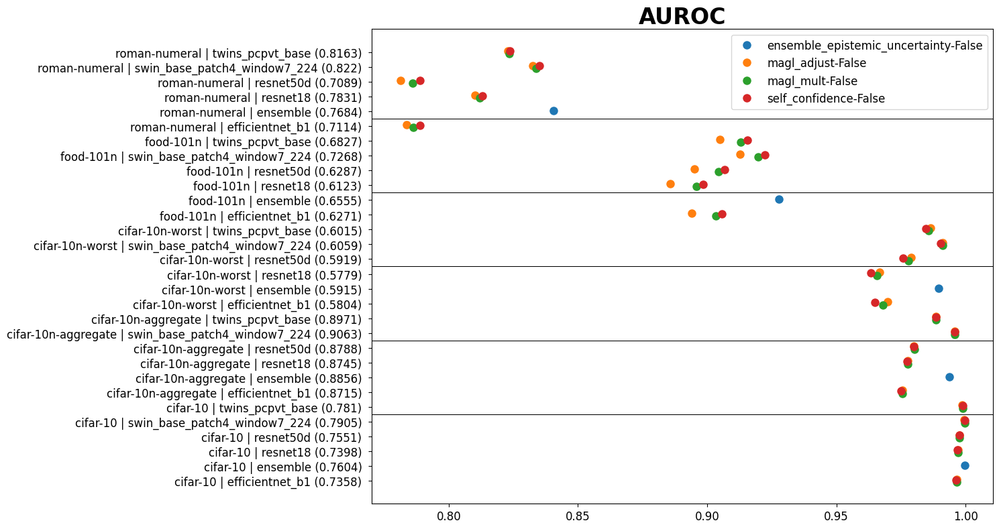

In [263]:
draw_full_plot_lift(df_auroc, title="AUROC")

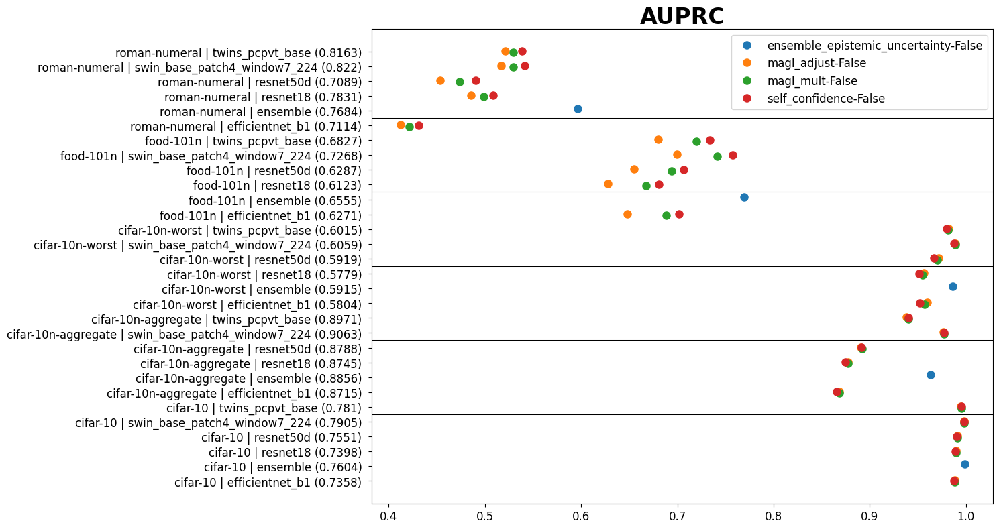

In [264]:
draw_full_plot_lift(df_auprc, title="AUPRC")

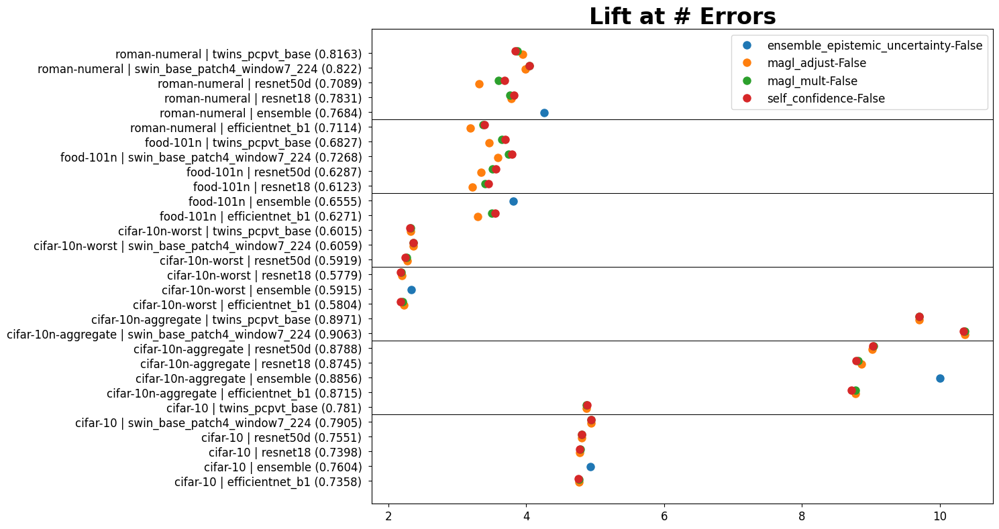

In [265]:
draw_full_plot_lift(df_lift_at_num_errors, title="Lift at # Errors")

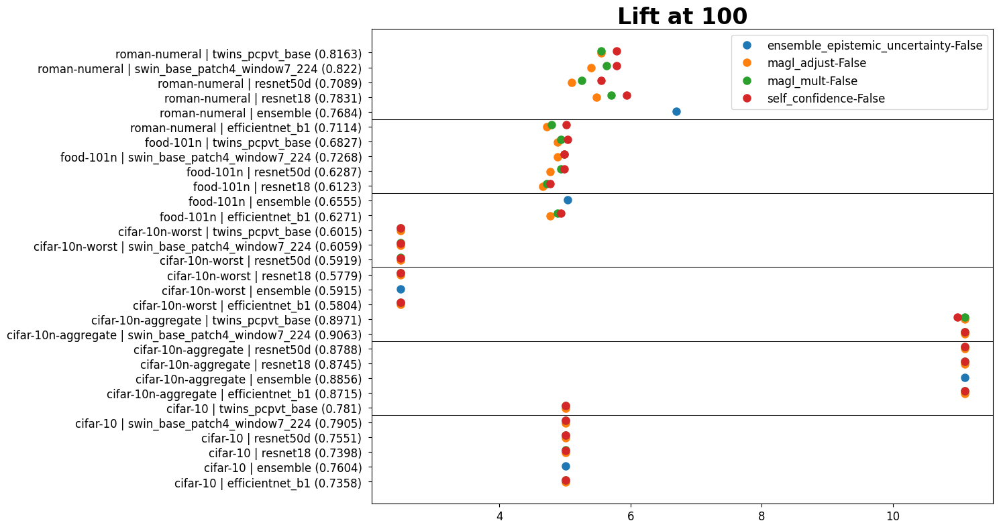

In [266]:
draw_full_plot_lift(df_lift_at_100, title="Lift at 100")

## 4. Finalize results for presentation (i.e. if you want fancy display names for plots)

In [287]:
# dictionaries to map to display name
method_adjust_pred_probs_display_dict = {
    "self_confidence-False": "Self Confidence",
    "magl_mult-False": "MAGL mult",
    "magl_adjust-False": "MAGL adjust",
    "ensemble_epistemic_uncertainty-False": "Epistemic Uncertainty",
    # "function_name-adjust_pred_probs": "Fancy Display Name", 3. Add your method + display name here
}

model_display_name_dict = {
    "swin_base_patch4_window7_224": "Swin Transformer",
    "twins_pcpvt_base": "Twins PCPVT",
    "efficientnet_b1": "EfficientNet-B1",
    "resnet50d": "ResNet-50d",
    "resnet18": "ResNet-18",
    "ensemble": "Ensemble Model",
}

df = create_mixed_df(evals, accuracy_list, method_adjust_pred_probs_display_dict=method_adjust_pred_probs_display_dict, model_display_name_dict=model_display_name_dict)
df_auroc = get_pivot(df, "auroc")

['Epistemic Uncertainty', 'MAGL adjust', 'MAGL mult', 'Self Confidence']


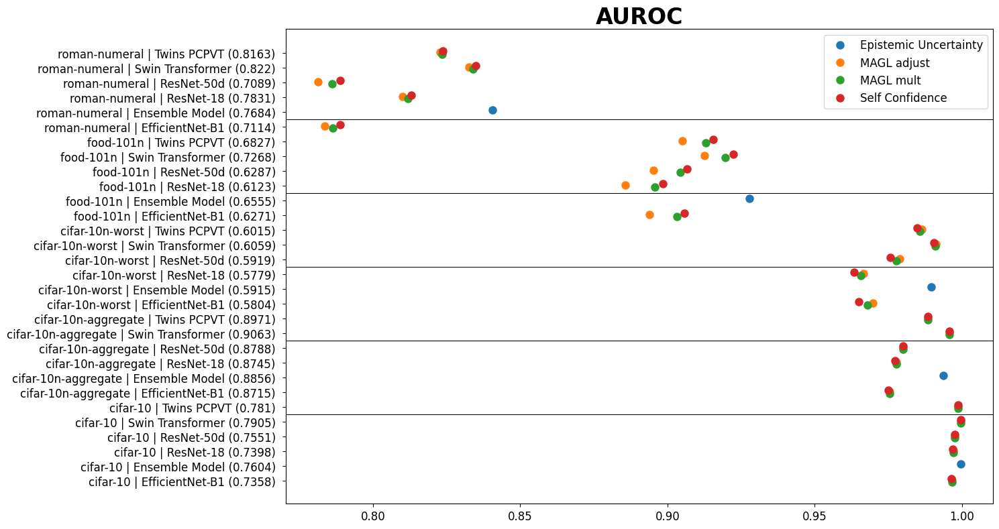

In [296]:
draw_full_plot_lift(df_auroc, title="AUROC")

# Below are some other example scores already tried and compared.

In [ ]:
# dictionaries to map to display name
method_adjust_pred_probs_display_dict = {
    "self_confidence-False": "Self Confidence",
    "self_confidence-True": "Adjusted Self Confidence",
    "normalized_margin-False": "Normalized Margin",
    "normalized_margin-True": "Adjusted Normalized Margin",
    "confidence_weighted_entropy-False": "Confidence Weighted Entropy",
    "entropy-False": "Entropy",
    "least_confidence-False": "Least Confidence",
    "magl-False": "Mass Above Given Label",
    "penalized_confidence-False": "Penalized Confidence",
    "rank_penalized_confidence-False": "Rank Penalized Confidence",
    "balanced_entropic_confidence-False": "Balanced Entropic Confidence",
    "entropic_confidence-False": "Entropic Confidence",
    "openset_score-False": "Openset Score",
    "openset_entropy_score-False": "Openset Entropy Score",
    "openset_entropy_prime_score-False": "Openset Entropy Prime Score",
    "mutual_info-False": "MI Confidence",
    "magl_mult-False": "MAGL mult",
    "magl_adjust-False": "MAGL adjust",
    "likelihood_ratio-False": "Likelihood Ratio",
    "likelihood_confidence_ratio-False": "Likelihood Confidence Ratio",
    "confidence_with_noclass-False": "CWNC",
    "confidence_with_noclass_entropy-False": "CWNC Entropy",
    "confidence_with_noclass_gap-False": "CWNC Gap",
    "centroid_distance-False": "Centroid Distance",
    "conformal_score-False": "Conformal Score",
    "conformal_score_adjust-False": "Conformal Score Adjust",
    "ensemble_epistemic_uncertainty-False": "Epistemic Uncertainty",
}

model_display_name_dict = {
    "swin_base_patch4_window7_224": "Swin Transformer",
    "twins_pcpvt_base": "Twins PCPVT",
    "efficientnet_b1": "EfficientNet-B1",
    "resnet50d": "ResNet-50d",
    "resnet18": "ResNet-18",
}

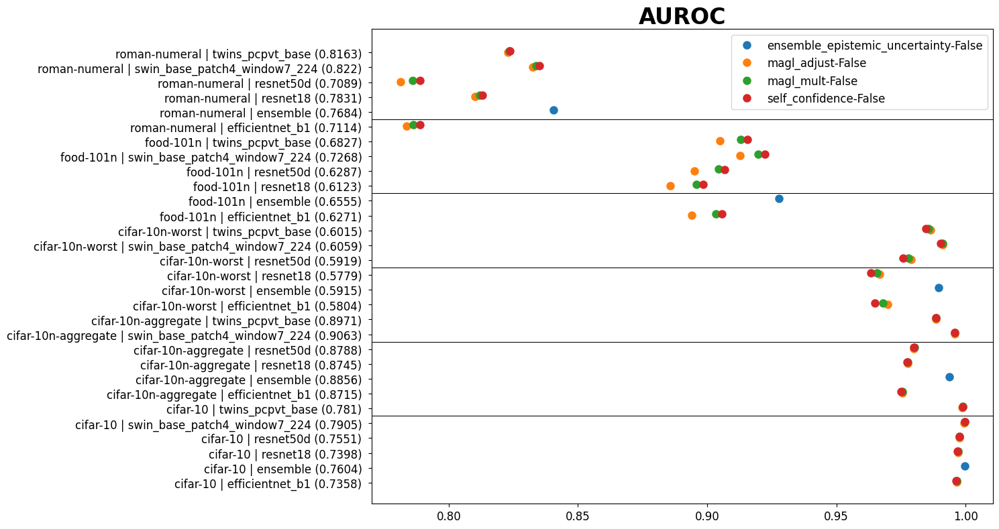

In [241]:
draw_full_plot_lift(df_auroc, title="AUROC")

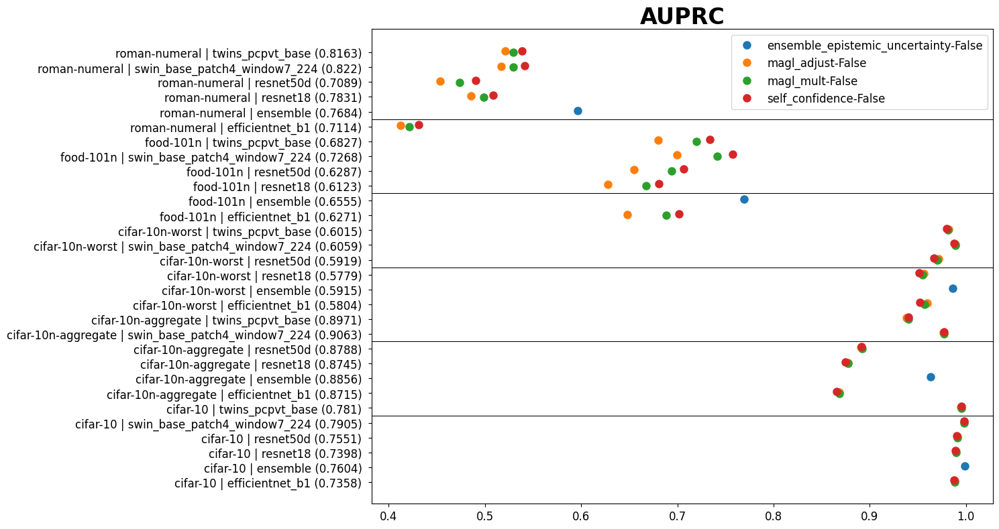

In [242]:
draw_full_plot_lift(df_auprc, title="AUPRC")

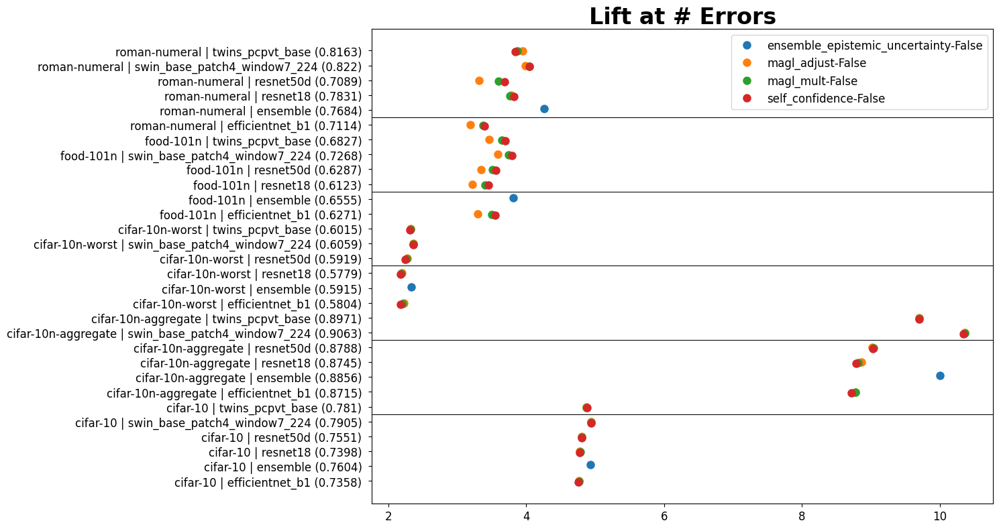

In [243]:
draw_full_plot_lift(df_lift_at_num_errors, title="Lift at # Errors")

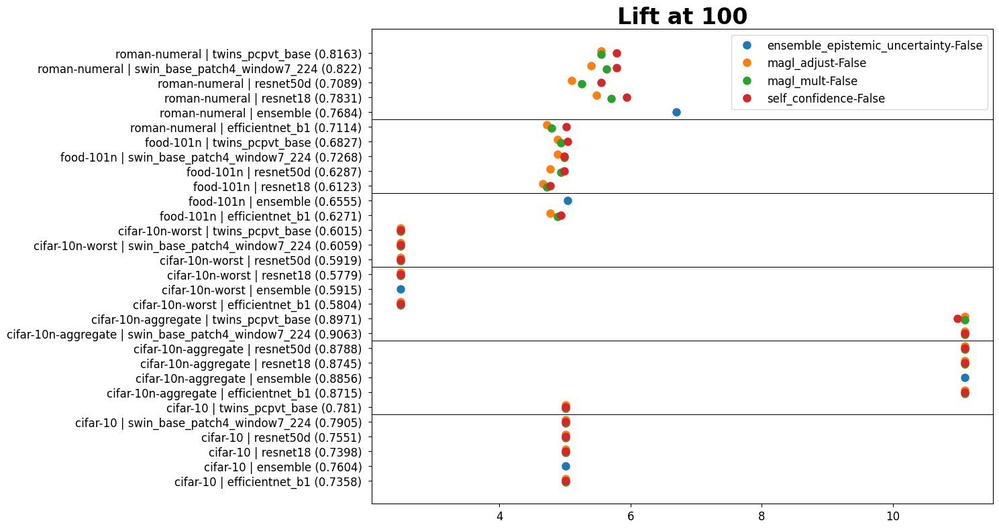

In [244]:
draw_full_plot_lift(df_lift_at_100, title="Lift at 100")

## Testing out alpha thresholds
Positive values mean new method is outperforming self_confidence. Negative means it underperforms.

In [253]:
import seaborn as sns

def scatterplot(df, method, hue='dataset'):
    plt.figure(figsize=(8,8))
    method = f'{method} - self_confidence'
    auroc = df.loc[df['method']==method]['Δauroc']
    auprc = df.loc[df['method']==method]['Δauprc'].tolist()
    hue_vals = df.loc[df['method']==method][hue].tolist()
    df = pd.DataFrame(zip(auroc, auprc, hue_vals), columns=['auroc','auprc',hue])
    
    plt.axline((0,0), slope=0)
    plt.axline((0,0), slope=float("inf"))

    sns.scatterplot(x="auroc", y="auprc", data=df, hue=hue)
    
    plt.title(f'auroc-auprc-{method}')
#     plt.savefig(f'./scatter-aurocprc-{method}-{len(df)}.png', dpi=300)
    plt.show()

In [315]:
score_params = \
[
    ("self_confidence", False, 0),
    ("magl_adjust", False, 0.001),
    ("magl_adjust", False, 0.01),
    ("magl_adjust", False, 0.1),
    ("magl_adjust", False, 0.5),
    ("magl_adjust", False, 0.8),
    ("magl_adjust", False, 0.9),
    ("magl_adjust", False, 0.99),
]

new_methods = [param for param in score_params if "self_confidence" not in param]
    
evaluations, precision_recall_curves, accuracy_list = eval_exp(experiments, score_params)
evaluations, precision_recall_curves, accuracy_list = ensemble_eval(experiments, score_params, evaluations, precision_recall_curves, accuracy_list)

dfs_new_methods_results = vis_results(evaluations, new_methods)

# Individual scatterplots per method

# for method in new_methods:
#     scatterplot(dfs_new_methods_results, method, hue='dataset')

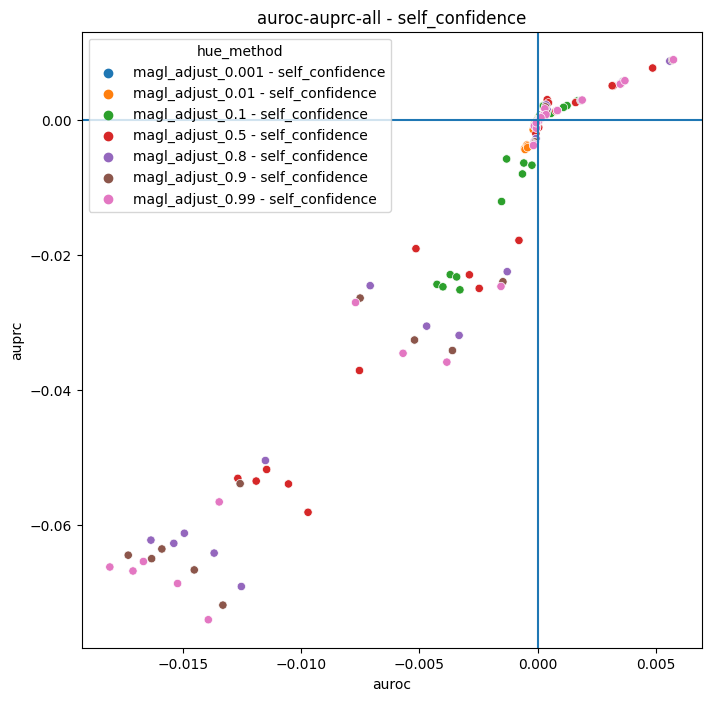

In [319]:
dfs_new_methods_results['hue_method'] = dfs_new_methods_results['method']
dfs_new_methods_results['method'] = 'all - self_confidence'
scatterplot(dfs_new_methods_results, 'all', hue='hue_method')

# Plotting correlations

A good adjustment x will lead to better separation between the two colored examples in the scatterplot than merely considering self_confidence alone.  Some good candidates to consider for x:
- mass above given label
- max pred_prob among classes that are not the given label (ie. the thing used in normalized-margin)
- number of classes more likely than given label (ie. the thing used in rank scores we explored)
- max_pred_prob(among classes that are not given label) - pred_prob(given_label)
- H(pred_prob)  = overall entropy
- H(p’) = entropy among renormalized probability vector after getting rid of given label (p' is defined as we considered before)
- H(p_) = entropy among renormalized probability vector p_ formed by only keeping classes with equal or lower pred_prob than given label (discard given label though), define it is 1 if no classes meet this criterion.

In [133]:
results = []

for experiment in experiments:
    
    # experiment results
    dataset = experiment["dataset"]
    model = experiment["model"]
    pred_probs = experiment["pred_probs"]
    labels = experiment["labels"]
    images = experiment["images"]
    label_errors_target = experiment["label_errors_mask"]
    type_train = experiment["type_train"]
    
    print(dataset, model)
    # finding label issues (score param agnostic)
    find_label_issues = cleanlab.filter.find_label_issues(labels, pred_probs, filter_by='confident_learning')
    num_label_issues = cleanlab.count.num_label_issues(labels, pred_probs)
    self_confidence = get_label_quality_scores(labels, pred_probs, method="self_confidence", adjust_pred_probs=False)
    
    # mass above given label
    mass_above_given_label = np.sum(np.clip(pred_probs - self_confidence[:,np.newaxis], a_min=0, a_max=None), axis=1)
    score = 1-mass_above_given_label
    results.append((f'magl-{dataset}-{model}', score, self_confidence, label_errors_target))
    
    # max pred_prob
    mask = pred_probs.copy()
    mask[np.arange(mask.shape[0]), labels] = -1
    pred_probs_prime = mask[mask != -1]
    pred_probs_prime = pred_probs_prime.reshape((labels.shape[0], -1))
    pred_probs_prime_norm = pred_probs_prime / np.sum(pred_probs_prime, axis=1)[:,np.newaxis]
    max_pred_prob = np.amax(pred_probs_prime_norm, axis=1) # todo should I renormalize this
    results.append((f'max pred prob-{dataset}-{model}', max_pred_prob, self_confidence, label_errors_target))
    
    # num classes more likeley than given label
    given_label_prob = pred_probs[np.arange(pred_probs.shape[0]), labels]
    given_label_prob = np.repeat(given_label_prob[:,np.newaxis], pred_probs.shape[1], axis=1)
    more_likeley = pred_probs >= given_label_prob # >= accounts for J+1 
    score = np.sum(more_likeley, axis=1)
    results.append((f'num classes more likeley than given label-{dataset}-{model}', score, self_confidence, label_errors_target))
    
    # max pred_prob - pred_prob given label
    score = max_pred_prob - pred_probs[np.arange(pred_probs.shape[0]), labels]
    results.append((f'max pred prob - pred prob given label-{dataset}-{model}', score, self_confidence, label_errors_target))
    
    # overall entropy
    normalized_entropy = get_normalized_entropy(pred_probs)
    results.append((f'H(p)-{dataset}-{model}', normalized_entropy, self_confidence, label_errors_target))
    
    # p' entropy
    normalized_entropy = get_normalized_entropy(pred_probs_prime_norm)
    results.append((f'H(p\')-{dataset}-{model}', normalized_entropy, self_confidence, label_errors_target))
    
    # H(p_) = entropy among renormalized probability vector p_ formed by only keeping classes with 
    # equal or lower pred_prob than given label (discard given label though), 
    # define it is 1 if no classes meet this criterion. 
    less_likeley = pred_probs_prime < given_label_prob[:,:-1]
#     no_class_idx = less_likeley.sum(axis=1) == 0
    
    less_pred_probs = pred_probs_prime * less_likeley
    less_pred_probs[~less_likeley] = np.nan
    less_pred_probs = less_pred_probs.tolist()
    less_pred_probs = [np.array(less)[~np.isnan(less)] for less in less_pred_probs]

    normalized_entropy = [get_normalized_entropy(np.reshape(less[:,np.newaxis], (1,len(less))))[0] if len(less) > 1 else 1 for less in less_pred_probs]
    normalized_entropy = np.array(normalized_entropy)
    results.append((f'H(p_)-{dataset}-{model}', normalized_entropy, self_confidence, label_errors_target))

roman-numeral swin_base_patch4_window7_224
fit called
predict_proba called (2831, 10), (2831, 10)
predict called
predict_proba called (2831, 10), (2831, 10)
(2831, 1)
(2831, 10, 48)
predict called
predict_proba called (2831, 10), (2831, 10)
predict called
predict_proba called (2831, 10), (2831, 10)
predict called
predict_proba called (2831, 10), (2831, 10)
predict called
predict_proba called (2831, 10), (2831, 10)
cs
fit called
predict_proba called (2831, 10), (2831, 10)
predict called
predict_proba called (2831, 10), (2831, 10)
cs0
cs1
predict called
predict_proba called (2831, 10), (2831, 10)
cs2
cifar-10n-worst swin_base_patch4_window7_224
fit called
predict_proba called (50000, 10), (50000, 10)
predict called
predict_proba called (50000, 10), (50000, 10)
(50000, 1)
(50000, 10, 48)
predict called
predict_proba called (50000, 10), (50000, 10)
predict called
predict_proba called (50000, 10), (50000, 10)
predict called
predict_proba called (50000, 10), (50000, 10)
predict called
predic

In [135]:
ensemble_experiments = build_ensemble_eval(experiments)

for dataset, ensemble_experiment in ensemble_experiments.items():
    model = "ensemble"
    pred_probs_list = []
    labels = ensemble_experiment[0]["labels"]
    images = ensemble_experiment[0]["images"]
    label_errors_target = ensemble_experiment[0]["label_errors_mask"]
    type_train = ensemble_experiment[0]["type_train"]

    accuracies = []
    print(dataset)
    
    for experiment in ensemble_experiment:
        pred_probs = experiment["pred_probs"]
        pred_probs_list.append(pred_probs)
        accuracies.append((pred_probs.argmax(axis=1) == labels).mean())

    # eu: epistemic uncertainty
    self_confidence_list = []
    pred_probs_avg = np.squeeze(np.array(pred_probs_list).mean(axis=0))
    l2e_uncertainty = []
    abs_uncertainty = []
    
    for pred_probs in pred_probs_list:
        self_confidence = get_label_quality_scores(labels, pred_probs, method="self_confidence", adjust_pred_probs=False)
        self_confidence_list.append(self_confidence)
        l2e_uncertainty.append(np.power(np.sum(np.power(pred_probs_avg - pred_probs, 2), axis=1), 1/2))
        abs_uncertainty.append(np.mean(np.abs(pred_probs_avg - pred_probs), axis=-1))
    
    self_confidence_list = np.array(self_confidence_list)
    self_confidence = np.squeeze(self_confidence_list.mean(axis=0))
    
    l2e_uncertainty = np.array(l2e_uncertainty)
    l2e_uncertainty = np.squeeze(l2e_uncertainty.mean(axis=0))
    results.append((f'l2-eu-{dataset}-{model}', l2e_uncertainty, self_confidence, label_errors_target))
    
    abs_uncertainty = np.array(abs_uncertainty)
    abs_uncertainty = np.squeeze(abs_uncertainty.mean(axis=0))
    results.append((f'abs-eu-{dataset}-{model}', abs_uncertainty, self_confidence, label_errors_target))

roman-numeral
cifar-10n-worst
cifar-10n-aggregate
cifar-10
food-101n


### Plotting correlations

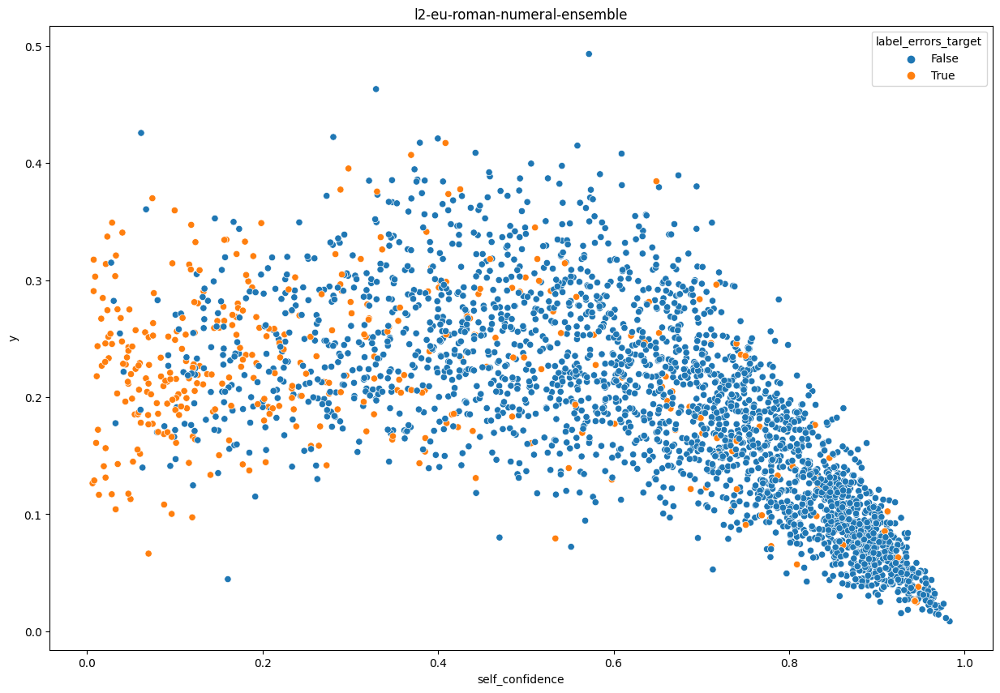

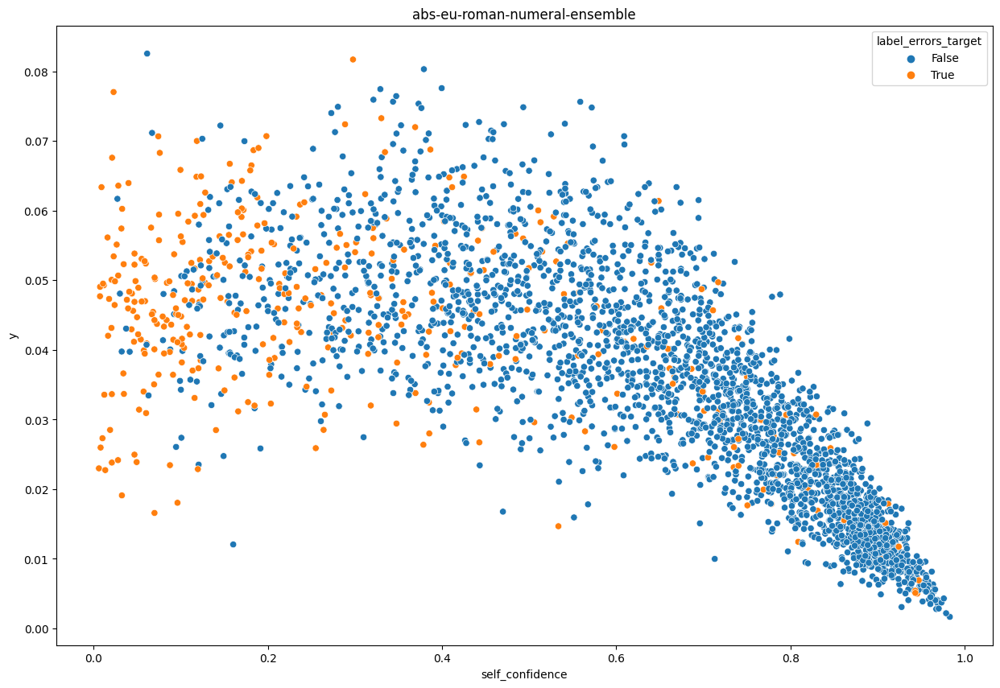

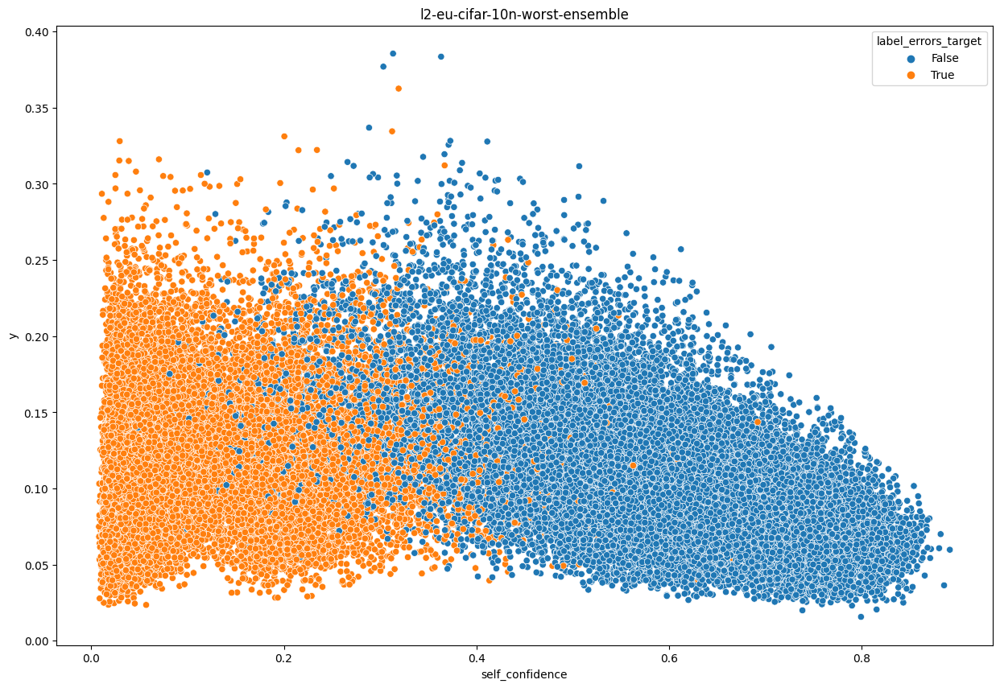

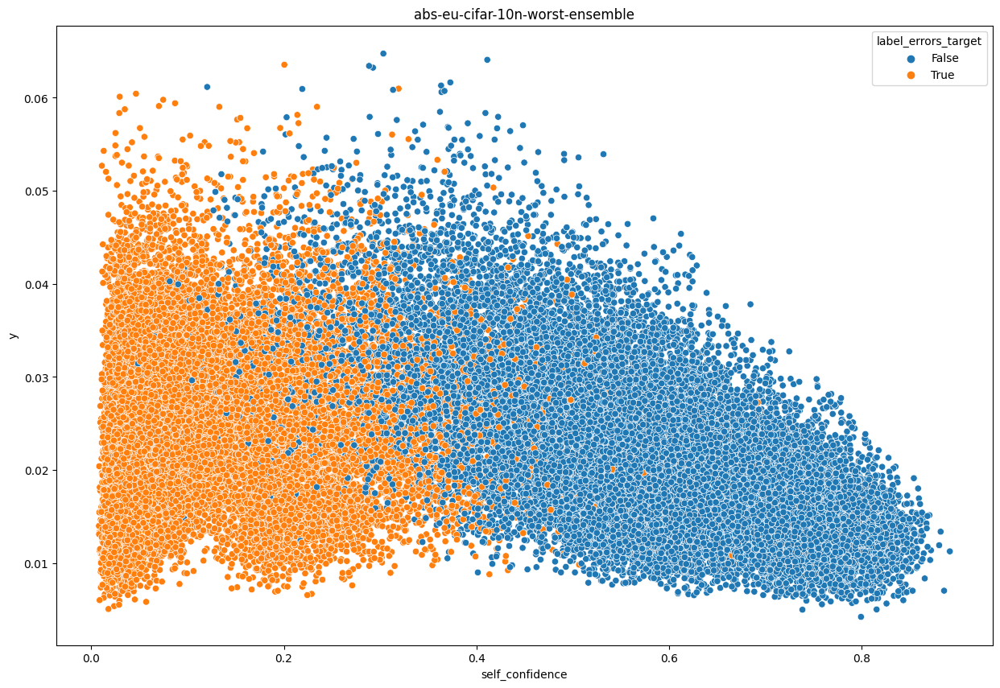

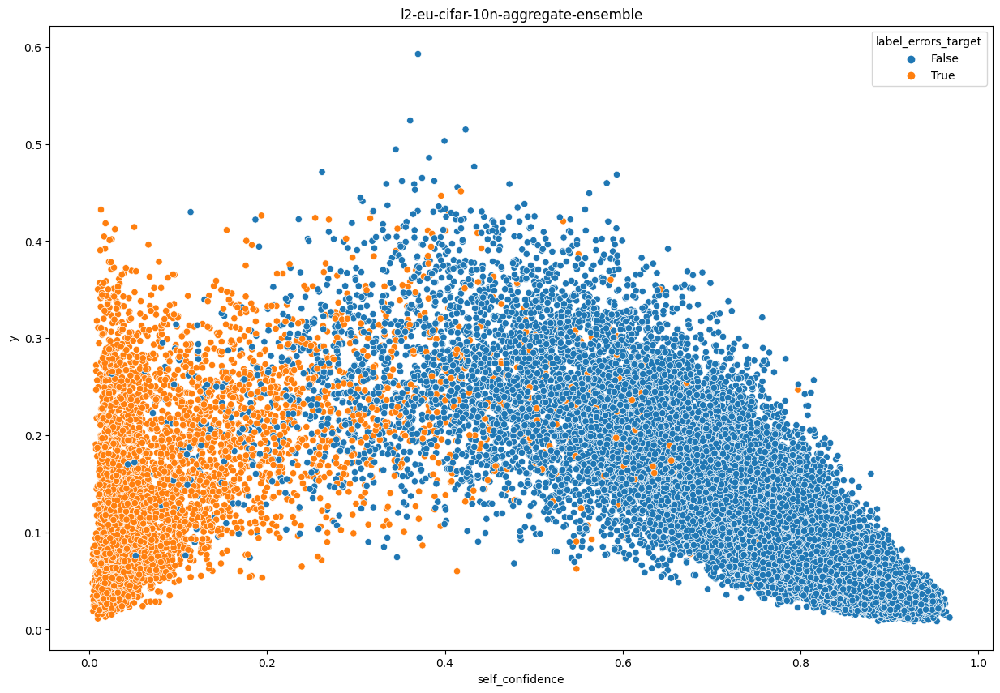

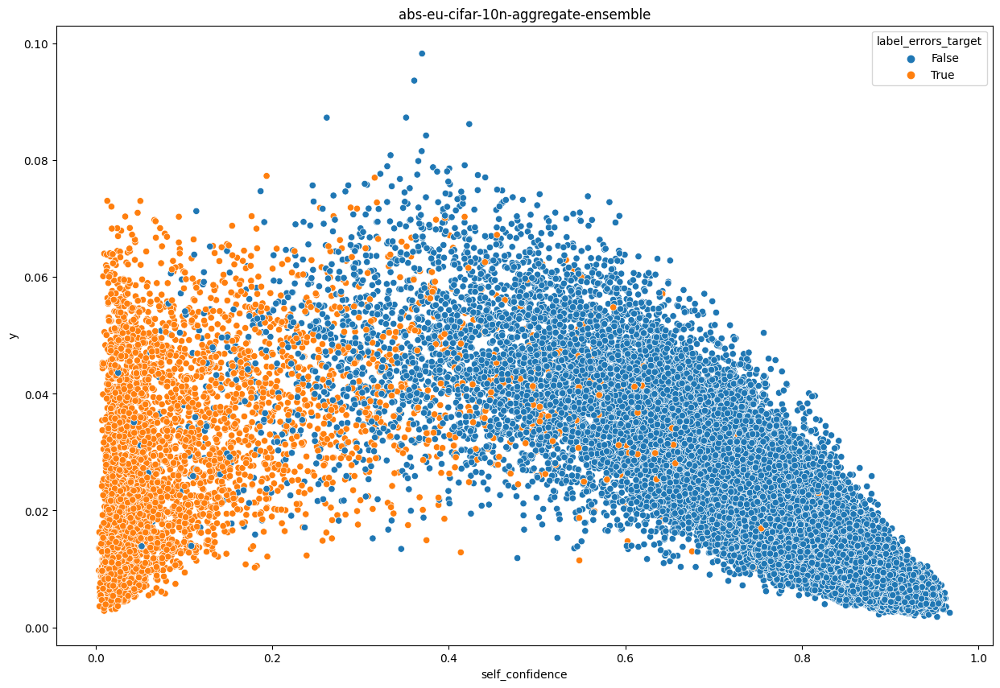

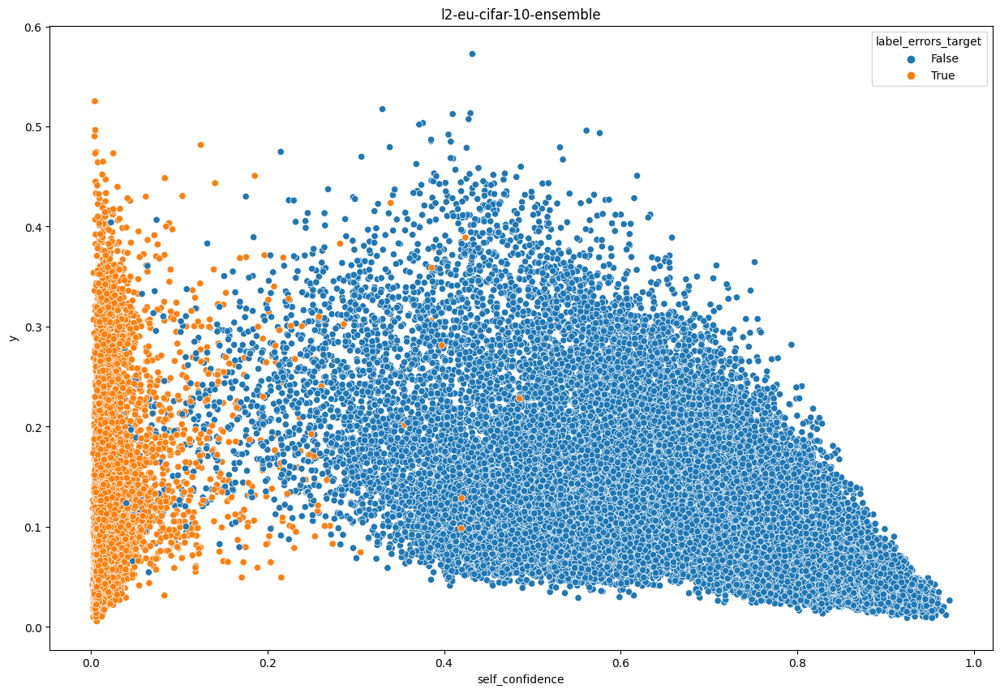

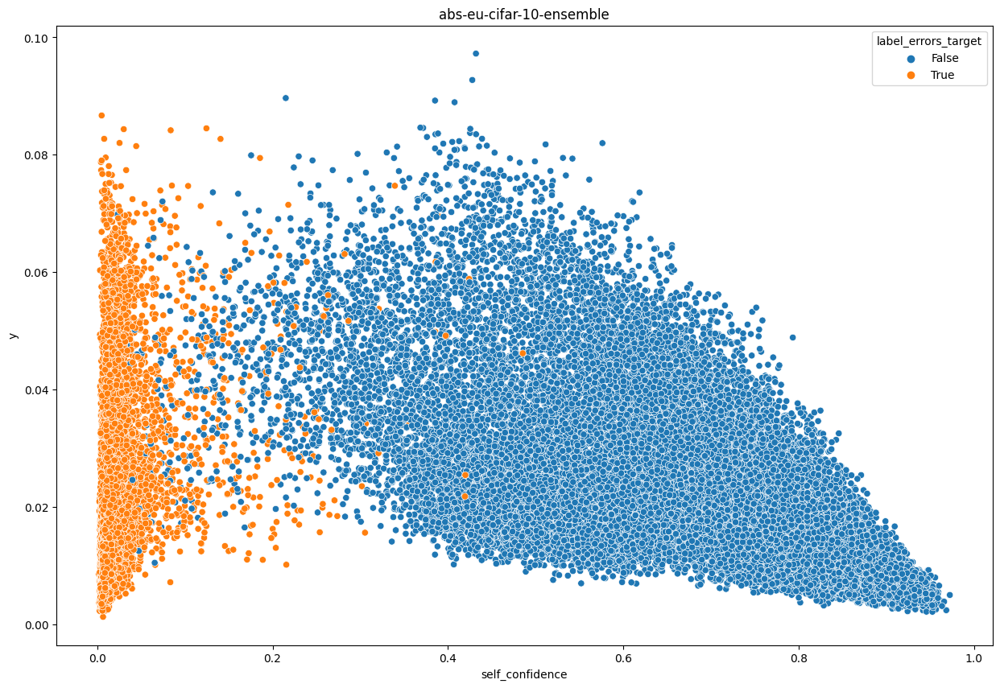

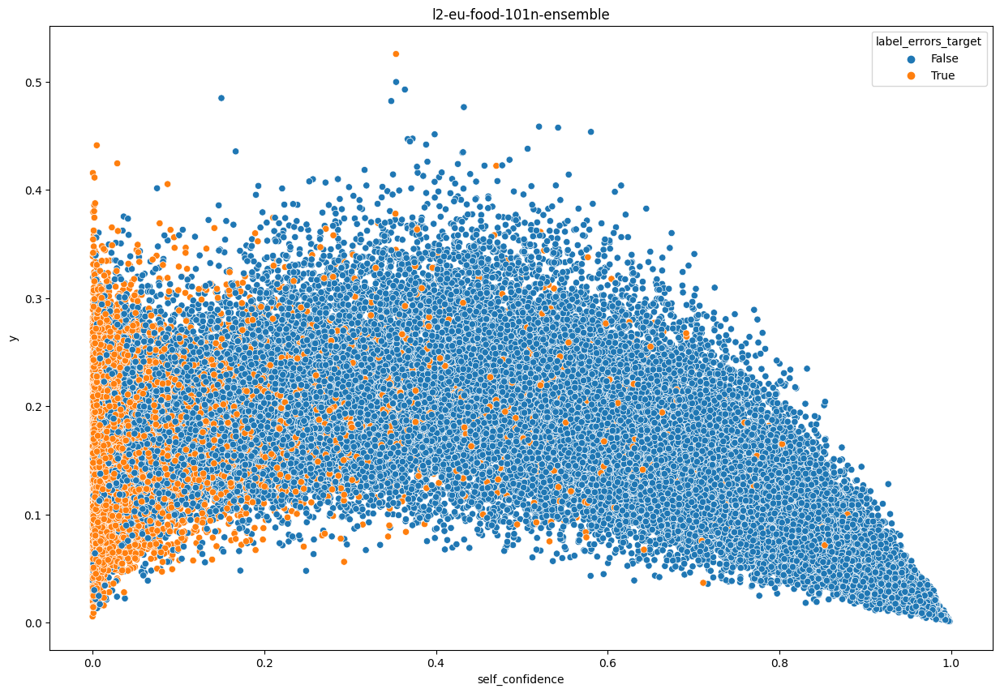

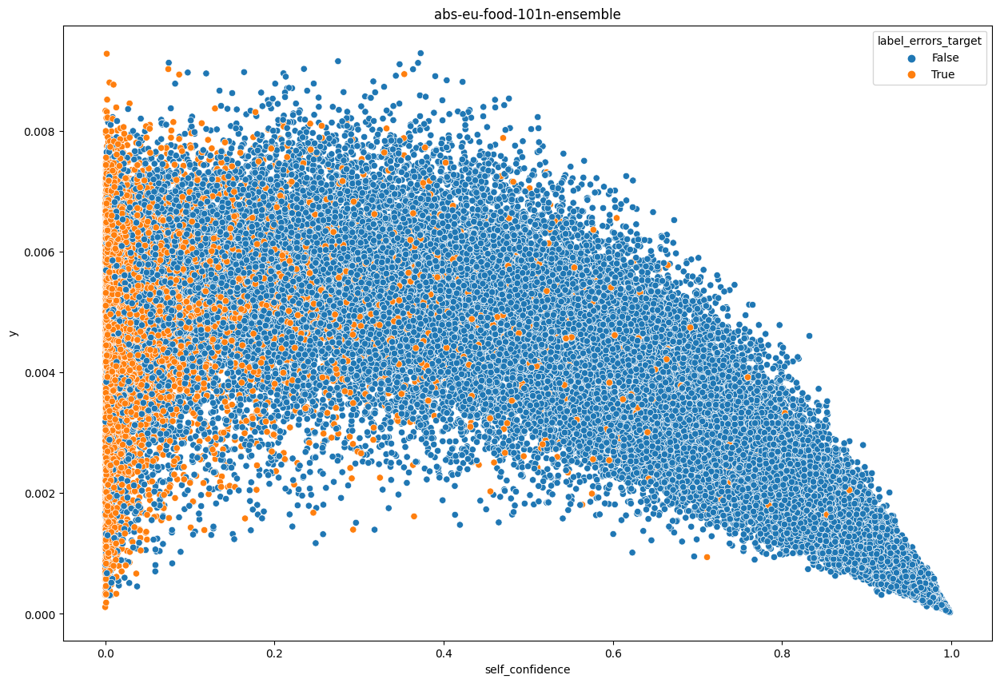

In [111]:
import seaborn as sns

for model, values, self_confidence, label_errors_target in results:
    plt.rcParams["figure.figsize"] = (15, 10)
    if "asds" not in model:
        continue
    df = pd.DataFrame(zip(self_confidence, values, label_errors_target), columns=['self_confidence','y','label_errors_target'])  
    sns.scatterplot(x="self_confidence", y="y", data=df, hue='label_errors_target')
    plt.title(f'{model}')
    plt.savefig(f'./figs-test/scatter-{model}.png', dpi=100)
    plt.show()

### Knn quantifying uncertainty

In [136]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import cross_val_score
from sklearn.preprocessing import MinMaxScaler

knn_results = []
for model, values, self_confidence, label_errors_target in results:
    if "ensemble" in model:
        print(model)
    else:
        continue
#     print(model)
    # rescale data
    print(np.mean(values), np.min(values), np.max(values))
    scaler = MinMaxScaler(feature_range = (0,0.2))
    values = np.squeeze(scaler.fit_transform(values.reshape(-1,1)))
    print(np.mean(values), np.min(values), np.max(values))


    # base value
    clf = KNeighborsClassifier(n_neighbors=5)
    scores = cross_val_score(clf, self_confidence.reshape(-1,1), label_errors_target, cv=5)
#     print(f'{model}-\n{round(np.mean(scores),5)}-{round(np.std(scores),5)}')
    
    clf = KNeighborsClassifier(n_neighbors=5)
    X =  np.array([self_confidence,values])
    X = np.transpose(X, (1,0))
    Xscores = cross_val_score(clf, X, label_errors_target, cv=5)
#     print(f'{round(np.mean(Xscores),5)}-{round(np.std(Xscores),5)}\n')
    
    delta_scores = round(np.mean(Xscores),5) - round(np.mean(scores),5)
    delta_std = round(np.std(Xscores),5) - round(np.std(scores),5)
    
    result = {
        "method": model,
        "^scores": delta_scores,
        "^std": delta_std,
    }
        
    knn_results.append(result)
pd.DataFrame(knn_results)

l2-eu-roman-numeral-ensemble
0.18674392352872643 0.008407885671989284 0.49319626829919
0.07357273575339635 0.0 0.20000000000000004
abs-eu-roman-numeral-ensemble
0.035269599004794705 0.0016625191892017017 0.08253639512963126
0.08310985327412145 0.0 0.2
l2-eu-cifar-10n-worst-ensemble
0.11120615109893907 0.01561482214470646 0.38555384445797725
0.05167950564203209 0.0 0.19999999999999998
abs-eu-cifar-10n-worst-ensemble
0.022224890141860947 0.004212290190160277 0.0647439745143056
0.059514616693114794 0.0 0.2
l2-eu-cifar-10n-aggregate-ensemble
0.09484646236290442 0.008191880826906524 0.5927518731816296
0.02964779754664227 0.0 0.19999999999999998
abs-eu-cifar-10n-aggregate-ensemble
0.017636023704192597 0.0017908476386219257 0.0982370213093236
0.03285807090630929 0.0 0.2
l2-eu-cifar-10-ensemble
0.1082676603867375 0.005534063095616115 0.5724301871415903
0.03624424049961925 0.0 0.2
abs-eu-cifar-10-ensemble
0.020631002423375833 0.001265354834496975 0.09722496431879699
0.040362080864964935 0.0 0.2

,method,^scores,^std
0,l2-eu-roman-numeral-ensemble,0.00247,-0.00175
1,abs-eu-roman-numeral-ensemble,0.00283,0.00323
2,l2-eu-cifar-10n-worst-ensemble,0.00486,-0.00099
3,abs-eu-cifar-10n-worst-ensemble,0.00632,-0.00109
4,l2-eu-cifar-10n-aggregate-ensemble,0.00176,0.00009
5,abs-eu-cifar-10n-aggregate-ensemble,0.00180,-0.00024
6,l2-eu-cifar-10-ensemble,-0.00126,0.00193
7,abs-eu-cifar-10-ensemble,-0.00070,0.00115
8,l2-eu-food-101n-ensemble,0.00216,-0.00055
9,abs-eu-food-101n-ensemble,0.00074,-0.00088


# [Extra Data From Previous Experiments]

Below is some extra functions and tests for other methods tried previously. These methods do not perform better than self-confidence but may provide some inspiration for further ideas

In [135]:
from cleanlab.internal.label_quality_utils import get_normalized_entropy
from sklearn.metrics import mutual_info_score
from scipy.stats import chi2_contingency #mi
from mapie.metrics import classification_mean_width_score
from sklearn.metrics.pairwise import euclidean_distances 

def penalized_confidence(labels, pred_probs, adjust_pred_probs=False):
    self_confidence = get_label_quality_scores(labels, pred_probs, method="self_confidence", adjust_pred_probs=adjust_pred_probs)
    given_label_prob = pred_probs[np.arange(pred_probs.shape[0]), labels]
    given_label_prob = np.repeat(given_label_prob[:,np.newaxis], pred_probs.shape[1], axis=1)
    more_likeley = pred_probs >= given_label_prob # >= accounts for J+1 
    J = np.sum(more_likeley, axis=1)
    return self_confidence / J
    

def rank_penalized_confidence(labels, pred_probs, adjust_pred_probs=False, alpha=0.50):
    self_confidence = get_label_quality_scores(labels, pred_probs, method="self_confidence", adjust_pred_probs=adjust_pred_probs)
    given_label_prob = pred_probs[np.arange(pred_probs.shape[0]), labels]
    given_label_prob = np.repeat(given_label_prob[:,np.newaxis], pred_probs.shape[1], axis=1)
    more_likeley = pred_probs >= given_label_prob # >= accounts for J+1 
    J = np.sum(more_likeley, axis=1)
    K = len(set(labels))
    rank  = (K - J) / K
    return alpha * self_confidence + (1 - alpha) * rank

def mutual_info(labels, pred_probs, adjust_pred_probs=False):
    print(pred_probs.shape, np.min(pred_probs), np.max(pred_probs))
    mi = mutual_info_score(labels_true=labels, labels_pred=pred_probs.argmax(axis=1), contingency=None)
    print(mi.shape, np.min(mi), np.max(mi))
    self_confidence = get_label_quality_scores(labels, pred_probs, method="self_confidence", adjust_pred_probs=adjust_pred_probs)    
    return self_confidence / mi

def openset_score(labels, pred_probs, adjust_pred_probs=False):
    p_in = np.amax(pred_probs, axis=1)
    p_hat = np.zeros((pred_probs.shape[0], pred_probs.shape[1]+1))
    p_hat[:,:-1] = pred_probs * p_in[:,np.newaxis]
    p_hat[:,-1] = 1 - p_in
    self_confidence = get_label_quality_scores(labels, p_hat, method="self_confidence", adjust_pred_probs=adjust_pred_probs)
    print(np.min(self_confidence),np.max(self_confidence), np.mean(self_confidence))
    return self_confidence

def openset_entropy_score(labels, pred_probs, adjust_pred_probs=False):
    p_in = 1.0 - get_normalized_entropy(pred_probs)
    p_hat = np.zeros((pred_probs.shape[0], pred_probs.shape[1]+1))
    p_hat[:,:-1] = pred_probs * p_in[:,np.newaxis]
    p_hat[:,-1] = 1 - p_in
    self_confidence = get_label_quality_scores(labels, p_hat, method="self_confidence", adjust_pred_probs=adjust_pred_probs)
    return self_confidence

# Idea we are allowing an extra set that encompasses both the true prediction and none of the above
def openset_entropy_prime_score(labels, pred_probs, adjust_pred_probs=False):
    mask = pred_probs.copy()
    mask[np.arange(mask.shape[0]), labels] = -1
    pred_probs_prime = mask[mask != -1]
    pred_probs_prime = pred_probs_prime.reshape((labels.shape[0], -1))
    
    p_in = np.amax(pred_probs, axis=1)
    
    p_hat = np.zeros((pred_probs_prime.shape[0], pred_probs_prime.shape[1]+1))
    p_hat[:,:-1] = pred_probs_prime * p_in[:,np.newaxis]
    p_hat[:,-1] = 1 - p_in
    
    self_confidence = get_label_quality_scores(labels, pred_probs, method="self_confidence", adjust_pred_probs=adjust_pred_probs)
    
    normalized_entropy = get_normalized_entropy(p_hat)
    x = np.abs(0.5 - normalized_entropy)
    self_confidence = (self_confidence / x ) * 0.5
    print(np.min(self_confidence),np.max(self_confidence), np.mean(self_confidence))
    
    return self_confidence

def entropic_confidence(labels, pred_probs, adjust_pred_probs=False):
    self_confidence = get_label_quality_scores(labels, pred_probs, method="self_confidence", adjust_pred_probs=adjust_pred_probs)
    mask = pred_probs.copy()
    mask[np.arange(mask.shape[0]), labels] = -1
    pred_probs_prime = mask[mask != -1]
    pred_probs_prime = pred_probs_prime.reshape((labels.shape[0], -1))
    pred_probs_prime = pred_probs_prime / np.sum(pred_probs_prime, axis=1)[:,np.newaxis]

    normalized_entropy = get_normalized_entropy(pred_probs_prime)
    return self_confidence / normalized_entropy
                          
def balanced_entropic_confidence(labels, pred_probs, adjust_pred_probs=False, alpha=1):
    self_confidence = get_label_quality_scores(labels, pred_probs, method="self_confidence", adjust_pred_probs=adjust_pred_probs)
    mask = pred_probs.copy()
    mask[np.arange(mask.shape[0]), labels] = -1
    pred_probs_prime = mask[mask != -1]
    pred_probs_prime = pred_probs_prime.reshape((labels.shape[0], -1))
    pred_probs_prime = pred_probs_prime / np.sum(pred_probs_prime, axis=1)[:,np.newaxis]

    normalized_entropy = get_normalized_entropy(pred_probs_prime)
    
    given_label_prob = pred_probs[np.arange(pred_probs.shape[0]), labels]
    c = np.amin([normalized_entropy, 1 - normalized_entropy], axis=0)
    return given_label_prob + alpha * c

def likelihood_ratio(labels, pred_probs, adjust_pred_probs=False):
    p_k = np.array([np.sum(labels == k)/len(labels) for k in set(labels)])
    p_k = np.repeat(p_k[np.newaxis], repeats=len(labels), axis=0)
    p_k = np.log(p_k)
    likeleyhood_ratio_score = p_k - np.log(pred_probs)
    return np.mean(likeleyhood_ratio_score, axis=1)

def likelihood_ratio(labels, pred_probs, adjust_pred_probs=False):
    p_y = pred_probs[np.arange(pred_probs.shape[0]), labels]
    p_y = np.repeat(p_y[:,np.newaxis], pred_probs.shape[1], axis=1)
    likeleyhood_ratio_score = np.log(pred_probs) - np.log(p_y)
    return 1 - np.mean(likeleyhood_ratio_score, axis=1)

def likelihood_confidence_ratio(labels, pred_probs, adjust_pred_probs=False, alpha=0.0003):
    self_confidence = get_label_quality_scores(labels, pred_probs, method="self_confidence", adjust_pred_probs=adjust_pred_probs)
    likeleyhood_ratio_score = likelihood_ratio(labels, pred_probs, adjust_pred_probs=adjust_pred_probs)
    return (1-alpha) * self_confidence + alpha * (1 - likeleyhood_ratio_score)

def confidence_with_noclass(labels, pred_probs, adjust_pred_probs=False):
    self_confidence = get_label_quality_scores(labels, pred_probs, method="self_confidence", adjust_pred_probs=adjust_pred_probs)
    p_k = np.array([np.sum(labels == k)/len(labels) for k in set(labels)])
    p_none = np.prod(1 - p_k)
    return self_confidence * (1 - p_none)

def confidence_with_noclass_entropy(labels, pred_probs, adjust_pred_probs=False):
    self_confidence = get_label_quality_scores(labels, pred_probs, method="self_confidence", adjust_pred_probs=adjust_pred_probs)
    normalized_entropy = get_normalized_entropy(pred_probs)
    c = np.mean(np.max(pred_probs, axis=1)) / np.mean(1 - normalized_entropy)
    p_none = normalized_entropy * c
    return self_confidence * (1 - p_none)

def confidence_with_noclass_gap(labels, pred_probs, adjust_pred_probs=False):
    self_confidence = get_label_quality_scores(labels, pred_probs, method="self_confidence", adjust_pred_probs=adjust_pred_probs)
    normalized_entropy = get_normalized_entropy(pred_probs)
    c = np.mean(np.max(pred_probs, axis=1)) / np.mean(1 - normalized_entropy)
    p_diff = np.partition(pred_probs, -2, axis=1)[:,-2:]
    p_none = c * (p_diff[:,1] - p_diff[:,0])
    return self_confidence * (p_none)

def centroid_distance(labels, pred_probs, adjust_pred_probs=False):
    J = [np.where(labels == k)[0] for k in range(len(set(labels)))]
    J_y = [J[int(label)] for label in labels]
    vector_y = np.array([np.mean(pred_probs[J_y[i]], axis=0) for i in range(len(labels))])
    score = -1 * np.linalg.norm(pred_probs-vector_y, axis=1)
    return score   

In [137]:
# Conformal set functions
from sklearn.base import BaseEstimator, ClassifierMixin
from mapie.classification import MapieClassifier
from sklearn.model_selection import train_test_split
from sklearn.utils.validation import check_X_y, check_array, check_is_fitted
from sklearn.utils.multiclass import unique_labels

class FakeClassifier(BaseEstimator, ClassifierMixin):
    def __init__(self, pred_probs=None):
        self.pred_probs = pred_probs

    def predict(self, X):
        print('predict called')
        return self.pred_probs
        
    def fit(self, X, y):
        print('fit called')
        X, y = check_X_y(X, y)
        self.classes_ = unique_labels(y)

        self.X_ = X
        self.y_ = y
        return self

    def predict_proba(self, X):
        print(f'predict_proba called {X.shape}, {self.pred_probs.shape}')
        return self.pred_probs
    
def conformal_score_adjust(labels, pred_probs, adjust_pred_probs=False, alpha=0.01):
    centers = [(0, 3.5), (-2, 0), (2, 0)]
    covs = [np.eye(2), np.eye(2)*2, np.diag([5, 1])]
    x_min, x_max, y_min, y_max, step = -6, 8, -6, 8, 0.1
    n_samples = len(labels)
    n_classes = pred_probs.shape[1]
    np.random.seed(42)
    X = np.random.random((n_samples,n_classes))
    y = np.random.randint(low=0, high=10, size=(n_samples,))

    X_train_cal, X_test, y_train_cal, y_test = X, X.copy(), y, y.copy()
    X_train, X_cal, y_train, y_cal = X, X.copy(), y, y.copy()

    xx, yy = np.meshgrid(
        np.arange(x_min, x_max, step), np.arange(x_min, x_max, step)
    )
    X_test_mesh = np.stack([xx.ravel(), yy.ravel()], axis=1)

    clf = FakeClassifier(pred_probs)
    clf.fit(pred_probs, labels)
    mapie_score = MapieClassifier(estimator=clf, cv="prefit", method="score")
    mapie_score.fit(X_cal, y_cal)
    alpha2 = np.arange(0.02, 0.98, 0.02)
    _, y_ps_score2 = mapie_score.predict(X_test, alpha=alpha2)
    
    widths_score = np.sum(y_ps_score2, axis=1)
    widths_score = np.mean(widths_score, axis=1)
    
    self_confidence = get_label_quality_scores(labels, pred_probs, method="self_confidence", adjust_pred_probs=adjust_pred_probs)
    
    return self_confidence + alpha * widths_score

def conformal_score(labels, pred_probs, adjust_pred_probs=False):
    # fake data copy paste for conformal score (to pass mapie internal checks)
    centers = [(0, 3.5), (-2, 0), (2, 0)]
    covs = [np.eye(2), np.eye(2)*2, np.diag([5, 1])]
    x_min, x_max, y_min, y_max, step = -6, 8, -6, 8, 0.1
    n_samples = len(labels)
    n_classes = pred_probs.shape[1]
    np.random.seed(42)
    X = np.random.random((n_samples,n_classes))
    y = np.random.randint(low=0, high=10, size=(n_samples,))

    X_train_cal, X_test, y_train_cal, y_test = X, X.copy(), y, y.copy()
    X_train, X_cal, y_train, y_cal = X, X.copy(), y, y.copy()

    xx, yy = np.meshgrid(
        np.arange(x_min, x_max, step), np.arange(x_min, x_max, step)
    )
    X_test_mesh = np.stack([xx.ravel(), yy.ravel()], axis=1)
    
    # actual conformal score
    clf = FakeClassifier(pred_probs)
    clf.fit(pred_probs, labels)
    mapie_score = MapieClassifier(estimator=clf, cv="prefit", method="score")
    mapie_score.fit(X_cal, y_cal)
    alpha2 = np.arange(0.02, 0.98, 0.02)
    _, y_ps_score2 = mapie_score.predict(X_test, alpha=alpha2)
    
    widths_score = np.sum(y_ps_score2, axis=1)
    widths_score = np.mean(widths_score, axis=1)
    self_confidence = get_label_quality_scores(labels, pred_probs, method="self_confidence", adjust_pred_probs=adjust_pred_probs)
    
    return self_confidence * widths_score


#### Plotting correlations extra correlations

In [ ]:
results = []

for experiment in experiments:
    
    # experiment results
    dataset = experiment["dataset"]
    model = experiment["model"]
    pred_probs = experiment["pred_probs"]
    labels = experiment["labels"]
    images = experiment["images"]
    label_errors_target = experiment["label_errors_mask"]
    type_train = experiment["type_train"]
    
    print(dataset, model)
    # finding label issues (score param agnostic)
    find_label_issues = cleanlab.filter.find_label_issues(labels, pred_probs, filter_by='confident_learning')
    num_label_issues = cleanlab.count.num_label_issues(labels, pred_probs)
    self_confidence = get_label_quality_scores(labels, pred_probs, method="self_confidence", adjust_pred_probs=False)
    
    # Mean Conformal adjustment
    # create fake data
    centers = [(0, 3.5), (-2, 0), (2, 0)]
    covs = [np.eye(2), np.eye(2)*2, np.diag([5, 1])]
    x_min, x_max, y_min, y_max, step = -6, 8, -6, 8, 0.1
    n_samples = len(labels)
    n_classes = pred_probs.shape[1]
    np.random.seed(42)
    X = np.random.random((n_samples,n_classes))
    y = np.random.randint(low=0, high=10, size=(n_samples,))

    X_train_cal, X_test, y_train_cal, y_test = X, X.copy(), y, y.copy()
    X_train, X_cal, y_train, y_cal = X, X.copy(), y, y.copy()

    xx, yy = np.meshgrid(
        np.arange(x_min, x_max, step), np.arange(x_min, x_max, step)
    )
    X_test_mesh = np.stack([xx.ravel(), yy.ravel()], axis=1)
    
        # calculate conformal adju score
    clf = FakeClassifier(pred_probs)
    clf.fit(pred_probs, labels)
    mapie_score = MapieClassifier(estimator=clf, cv="prefit", method="score")
    mapie_score.fit(X_cal, y_cal)
    alpha2 = np.arange(0.02, 0.98, 0.02)
    _, y_ps_score2 = mapie_score.predict(X_test, alpha=alpha2)
    
    print(mapie_score.conformity_scores_.shape)
    print(y_ps_score2.shape)
    
    results.append((f'C(mapie.conformity_scores_)-{dataset}-{model}', np.squeeze(mapie_score.conformity_scores_), self_confidence, label_errors_target))

    
    widths_score = np.sum(y_ps_score2, axis=1)
    score = np.mean(widths_score, axis=1)
    results.append((f'C(mean)-{dataset}-{model}', score, self_confidence, label_errors_target))
    
    score = np.max(widths_score, axis=1)
    results.append((f'C(max)-{dataset}-{model}', score, self_confidence, label_errors_target))
    
    score = np.min(widths_score, axis=1)
    results.append((f'C(min)-{dataset}-{model}', score, self_confidence, label_errors_target))
    
    alpha2 = np.array([0.8])
    _, y_ps_score2 = mapie_score.predict(X_test, alpha=alpha2)
    widths_score = np.sum(y_ps_score2, axis=1)
    score = np.mean(widths_score, axis=1)
    results.append((f'C(0.8)-{dataset}-{model}', score, self_confidence, label_errors_target))
    
    alpha2 = np.array([0.2])
    _, y_ps_score2 = mapie_score.predict(X_test, alpha=alpha2)
    widths_score = np.sum(y_ps_score2, axis=1)
    score = np.mean(widths_score, axis=1)
    results.append((f'C(0.2)-{dataset}-{model}', score, self_confidence, label_errors_target))
    
    alpha2 = np.array([0.05])
    _, y_ps_score2 = mapie_score.predict(X_test, alpha=alpha2)
    widths_score = np.sum(y_ps_score2, axis=1)
    score = np.mean(widths_score, axis=1)
    results.append((f'C(0.05)-{dataset}-{model}', score, self_confidence, label_errors_target))\
    
    alpha2 = np.array([0.95])
    _, y_ps_score2 = mapie_score.predict(X_test, alpha=alpha2)
    widths_score = np.sum(y_ps_score2, axis=1)
    score = np.mean(widths_score, axis=1)
    results.append((f'C(0.95)-{dataset}-{model}', score, self_confidence, label_errors_target))
    
    if "food" in dataset:
        continue
        
    print('cs')
    clf = FakeClassifier(pred_probs)
    clf.fit(pred_probs, labels)
    mapie_score = MapieClassifier(estimator=clf, cv="prefit", method="cumulated_score")
    mapie_score.fit(X_cal, y_cal)
    alpha2 = np.arange(0.02, 0.98, 0.02)
    _, y_ps_score2 = mapie_score.predict(X_test, alpha=alpha2)
    
    results.append((f'CS(mapie.conformity_scores_)-{dataset}-{model}', np.squeeze(mapie_score.conformity_scores_), self_confidence, label_errors_target))

    
    print('cs0')
    widths_score = np.sum(y_ps_score2, axis=1)
    score = np.mean(widths_score, axis=1)
    results.append((f'CS(mean)-{dataset}-{model}', score, self_confidence, label_errors_target))
    
    print('cs1')
    alpha2 = np.array([0.2])
    _, y_ps_score2 = mapie_score.predict(X_test, alpha=alpha2)
    widths_score = np.sum(y_ps_score2, axis=1)
    score = np.mean(widths_score, axis=1)
    results.append((f'CS(0.2)-{dataset}-{model}', score, self_confidence, label_errors_target))
    
    print('cs2')
    alpha2 = np.array([0.05])
    score = np.mean(widths_score, axis=1)
    results.append((f'CS(0.05)-{dataset}-{model}', score, self_confidence, label_errors_target))
    